In [1]:
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import unittest

from skimage.metrics import peak_signal_noise_ratio
from PIL import Image

%matplotlib inline
%load_ext autoreload
%autoreload 2

plt.rcParams.update({'font.size': 12})
torch.random.manual_seed(1904)
test = unittest.TestCase()

# Loss 
mse = torch.nn.MSELoss()

In [2]:
dev = 'cuda' if torch.cuda.is_available() else 'cpu'
device = torch.device(dev)

print(f'Using device {device}')

Using device cuda


In [3]:
IMAGE = 'zebra'
factor = 4

input_depth = 32
output_depth = 3

if IMAGE == 'zebra':
    fname = './data/sr/zebra_GT.png'
    
    nd = [128, 128, 128, 128, 128]
    nu = nd[:]
    kd = [3, 3, 3, 3, 3]
    ku = kd[:]
    ns = [4, 4, 4, 4, 4]
    ks = [1, 1, 1, 1, 1]
else:
    assert False

In [4]:
from models import *
from models.unet import *

from utils import *

downsampler = lanczos_downsampler(output_depth, factor, device=device)

net = UNet(input_depth, output_depth, nu, nd, ns, ku, kd, ks)
net.to(device)

print(f'Image is {IMAGE}')
print(net)

Image is zebra
UNet(
  (downs): ModuleList(
    (0): DownsampleBlock(
      (conv1): ConvBlock(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(32, 128, kernel_size=(3, 3), stride=(2, 2))
        (norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): LeakyReLU(negative_slope=0.2)
      )
      (conv2): ConvBlock(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
        (norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): LeakyReLU(negative_slope=0.2)
      )
    )
    (1): DownsampleBlock(
      (conv1): ConvBlock(
        (pad): ReflectionPad2d((1, 1, 1, 1))
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
        (norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (activation): LeakyReLU(negative_slope=0.2)
      )
      (conv

In [5]:
s = sum([np.prod(list(p.size())) for p in net.parameters()])
print(f'Number of params: {s}')

Number of params: 2217831


Image dim : (3, 384, 576)


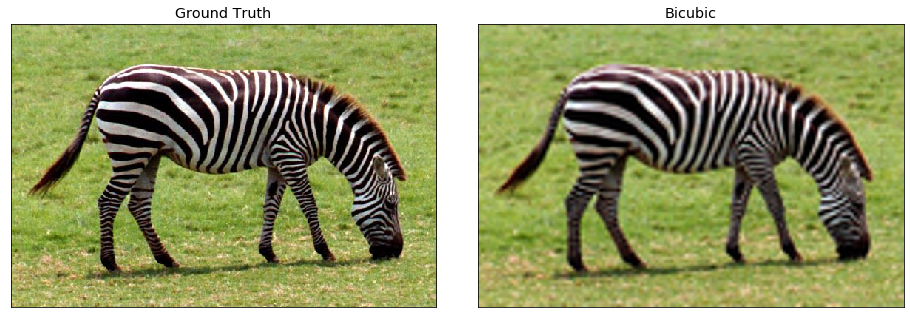

In [6]:
from input_gen import *

img_hr_pil = crop_image(get_image(fname, -1)[0])
img_hr_np = pil_to_np(img_hr_pil)
img_hr_tr = torch.from_numpy(img_hr_np).type(torch.FloatTensor)

hr_width, hr_height = img_hr_pil.size
lr_size = (hr_width // factor, hr_height // factor)
img_lr_pil = img_hr_pil.resize(lr_size, Image.LANCZOS)
img_lr_np = pil_to_np(img_lr_pil)
img_lr_tr = torch.from_numpy(img_lr_np).type(torch.FloatTensor)

img_bicubic_pil = img_lr_pil.resize(img_hr_pil.size, Image.BICUBIC)
img_bicubic_np = pil_to_np(img_bicubic_pil)
img_bicubic_tr = torch.from_numpy(img_bicubic_np).type(torch.FloatTensor)

print(f'Image dim : {img_hr_np.shape}')

fig, axes = tensors_as_images([img_hr_tr, img_bicubic_tr],
                              titles=['Ground Truth', 'Bicubic'],
                              figsize=(16,16))

In [7]:
target_img = img_hr_tr
target_img = target_img.unsqueeze(dim=0).to(device)
net_input = get_noise(input_depth, *img_hr_tr.shape[1:], method='noise').unsqueeze(dim=0).detach().to(device)
noise = net_input.detach().clone()

# HyperParmaters for each image
if factor == 4:
    LR = 0.01
    num_iter = 2000
    reg_noise_std = 1.0/30
elif factor == 8:
    LR = 0.01
    num_iter = 4000
    reg_noise_std = 1.0/20
        
print(f'Hyperparameters : LR = {LR},  num_iter = {num_iter},  std = {reg_noise_std}')

Hyperparameters : LR = 0.01,  num_iter = 2000,  std = 0.03333333333333333


# Vanilla training

C:\Users\User\Miniconda3\envs\cs236781-hw\lib\site-packages\torch\nn\functional.py:2494: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
C:\Users\User\Miniconda3\envs\cs236781-hw\lib\site-packages\torch\nn\modules\loss.py:431: UserWarning: Using a target size (torch.Size([3, 96, 144])) that is different to the input size (torch.Size([1, 3, 96, 144])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


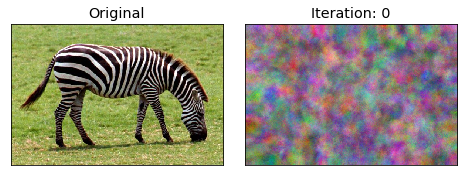

Iteration  100   Loss = 0.012646   PSNR_LR = 18.980586   PSNR_HR=17.40186161 
Iteration  200   Loss = 0.006074   PSNR_LR = 22.164907   PSNR_HR=19.57281313 


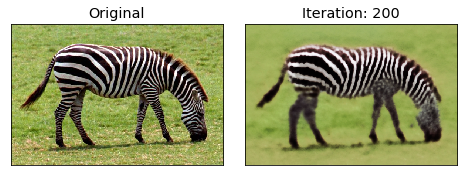

Iteration  300   Loss = 0.004144   PSNR_LR = 23.826233   PSNR_HR=20.56855757 
Iteration  400   Loss = 0.002896   PSNR_LR = 25.382614   PSNR_HR=21.42063232 


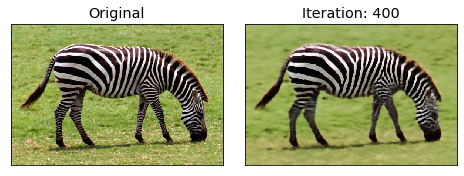

Iteration  500   Loss = 0.002427   PSNR_LR = 26.148865   PSNR_HR=21.78798989 
Iteration  600   Loss = 0.001960   PSNR_LR = 27.078541   PSNR_HR=22.20740909 


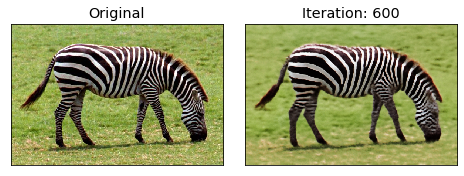

Iteration  700   Loss = 0.001690   PSNR_LR = 27.722050   PSNR_HR=22.39576060 
Iteration  800   Loss = 0.001494   PSNR_LR = 28.257249   PSNR_HR=22.72469191 


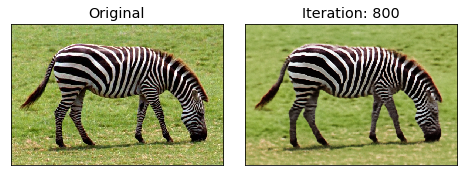

Iteration  900   Loss = 0.001318   PSNR_LR = 28.800407   PSNR_HR=22.87929090 
Iteration  1000   Loss = 0.001171   PSNR_LR = 29.314195   PSNR_HR=23.08039393 


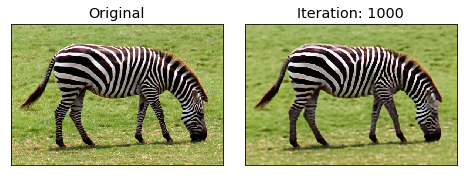

Iteration  1100   Loss = 0.001102   PSNR_LR = 29.577240   PSNR_HR=23.08329393 
Iteration  1200   Loss = 0.000991   PSNR_LR = 30.037238   PSNR_HR=23.20640707 


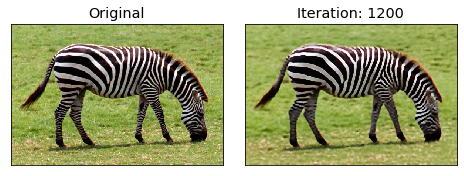

Iteration  1300   Loss = 0.000940   PSNR_LR = 30.270731   PSNR_HR=23.19616363 
Iteration  1400   Loss = 0.000818   PSNR_LR = 30.871110   PSNR_HR=23.38845959 


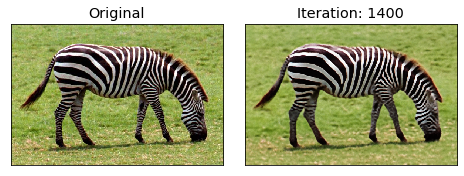

Iteration  1500   Loss = 0.000787   PSNR_LR = 31.038716   PSNR_HR=23.32590707 
Iteration  1600   Loss = 0.000758   PSNR_LR = 31.202891   PSNR_HR=23.49826565 


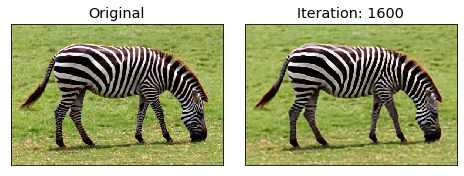

Iteration  1700   Loss = 0.000678   PSNR_LR = 31.688735   PSNR_HR=23.65533333 
Iteration  1800   Loss = 0.000640   PSNR_LR = 31.934874   PSNR_HR=23.59913030 


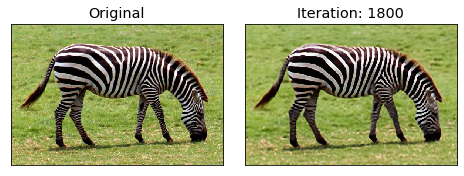

Iteration  1900   Loss = 0.000606   PSNR_LR = 32.173353   PSNR_HR=23.72562323 
Done training final Loss = 0.0006179820629768074   PSNR_LR = 32.09024156227986   PSNR_HR = 23.68528599404611


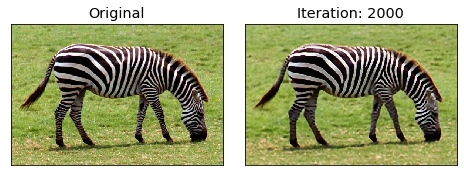

In [8]:
# Training loop, can change hyperparameters mid way
show_every = 100
optimizer = torch.optim.Adam(net.parameters(), lr=LR)

psnr_lr_res = []
psnr_hr_res = []
losses_res = []

for i in range(num_iter):
    optimizer.zero_grad()
    
    if reg_noise_std > 0:
        net_input_mod = net_input + (noise.normal_() * reg_noise_std)
    else:
        net_input_mod = net_input.clone()
    
    out = net(net_input_mod)
    out_copy = out.detach().cpu()
    out_down = downsampler(out)
    
    loss = mse(out_down, img_lr_tr.to(device))
    loss.backward()
    
    optimizer.step()
    
    psnr_lr = peak_signal_noise_ratio(img_lr_np, out_down.detach().cpu().numpy()[0]) 
    psnr_hr = peak_signal_noise_ratio(img_hr_np, out_copy.numpy()[0])
    
    psnr_lr_res.append(psnr_lr)
    psnr_hr_res.append(psnr_hr)
    losses_res.append(loss.item())
    
    print('Iteration  %d   Loss = %06f   PSNR_LR = %06f   PSNR_HR = %06f' % 
          (i, loss.item(), psnr_lr, psnr_hr), '\r', end='')
    if i % show_every == 0 and i:
        print('Iteration  %d   Loss = %06f   PSNR_LR = %06f   PSNR_HR=%06f' % 
              (i, loss.item(), psnr_lr, psnr_hr))
    if i % (show_every*2) == 0:
        fig, axes = tensors_as_images([img_hr_tr, out_copy[0]], 
                                      titles=['Original', f'Iteration: {i}'])
print(f'Done training final Loss = {loss.item()}   PSNR_LR = {psnr_lr}   PSNR_HR = {psnr_hr}')
fig, axes = tensors_as_images([img_hr_tr, out_copy[0].detach()], 
                                    titles=['Original', f'Iteration: {num_iter}'])

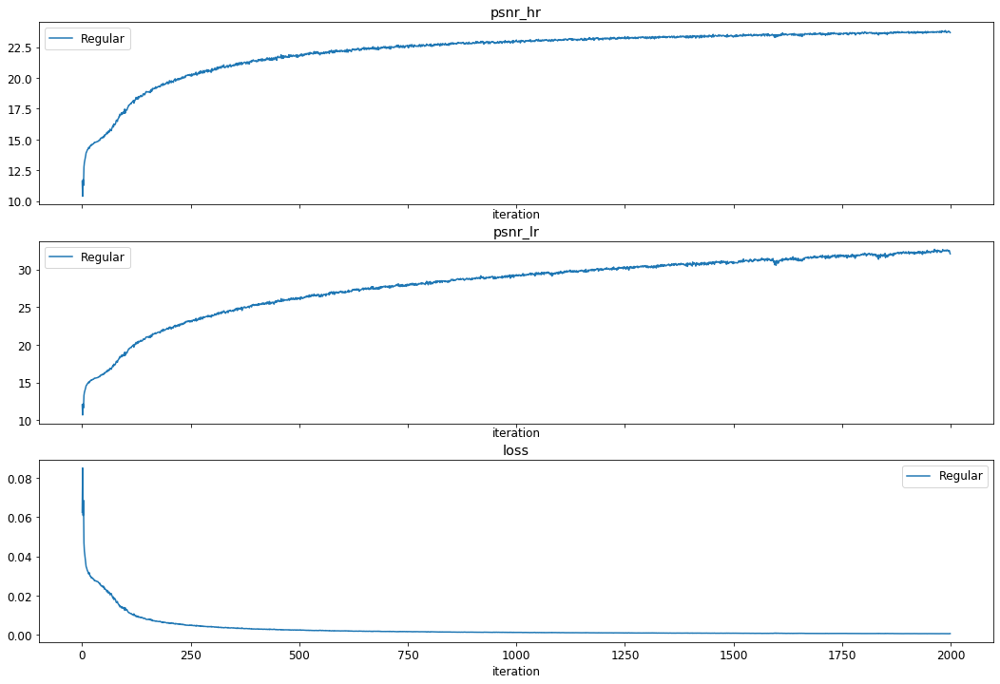

In [9]:
def plot_experiment_results(results, exp_name, fig=None):
    if fig is None:
        fig, _ = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(18,12))
    for i, plot_type in enumerate(('psnr_hr', 'psnr_lr', 'loss')):
        ax = fig.axes[i]
        if plot_type not in results:
            continue
        exp_res = results[plot_type]    
        ax.plot(list(range(len(exp_res))), exp_res, label=exp_name)
        ax.set_title(plot_type)
        ax.set_xlabel('iteration')
        ax.legend()
    return fig
    
experiments_results_fig = plot_experiment_results({'psnr_hr': psnr_hr_res, 'psnr_lr': psnr_lr_res, 'loss': losses_res}, 'Regular')

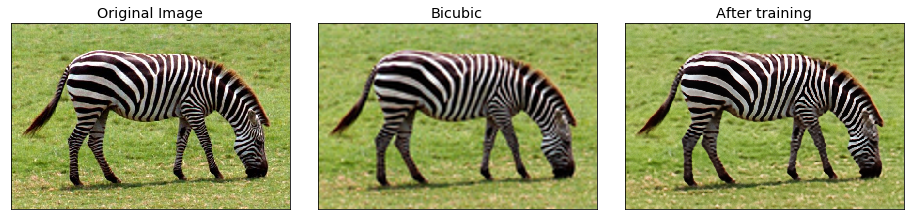

In [10]:
# Showing result of the training
with torch.no_grad():
    original_noise = net_input
    output = net(original_noise).detach()
    output = output.squeeze(dim=0)
    
    fig, axes = tensors_as_images([img_hr_tr, img_bicubic_tr, output], 
                                        titles=['Original Image', 'Bicubic', 'After training'],
                                        figsize=(16,16))
    
    output_pil = np_to_pil(output.detach().cpu().numpy())
    output_pil.save(f'results/sr/{IMAGE}_{factor}.png')
    
    normal_training_output = output

 Best PSNR = 24.028870   Best p = 0.002250


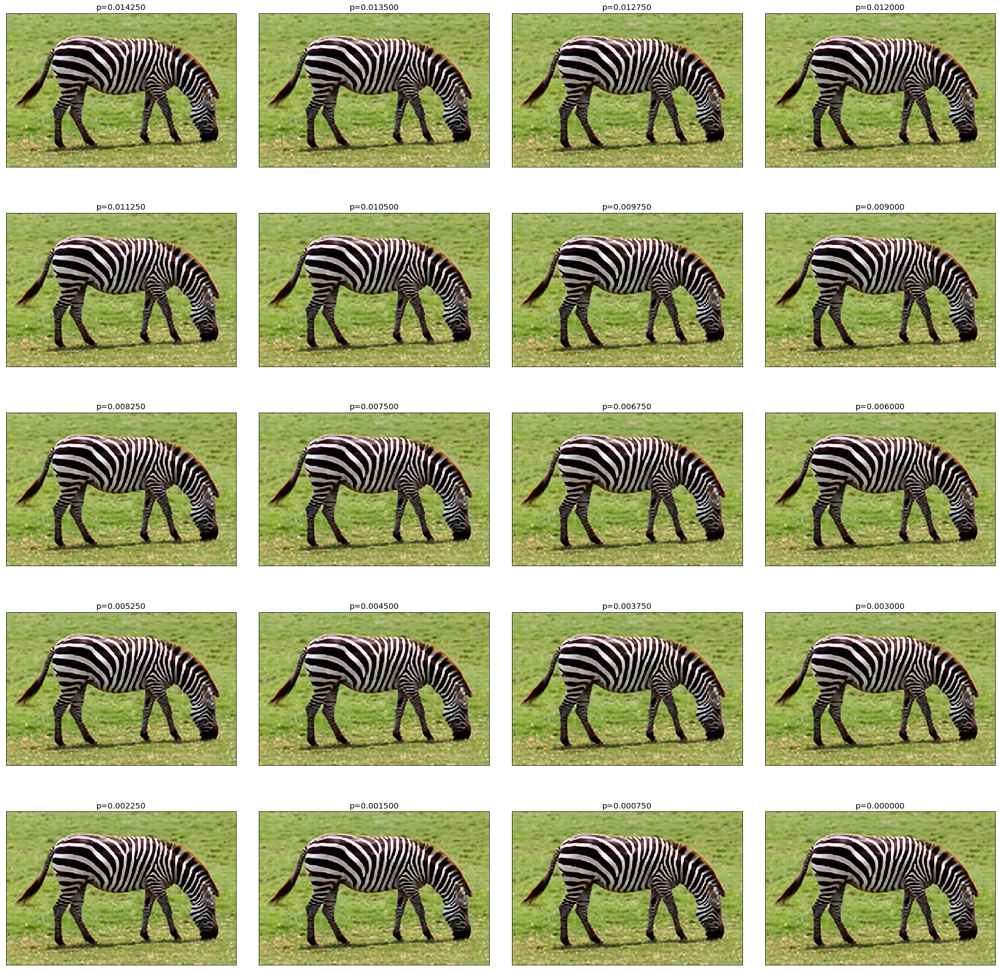

In [11]:
# Try to get better results by changing z_input a bit
with torch.no_grad():
    a = torch.rand(*original_noise.shape)  
    
    best_psnr = 0
    best_p = 0
    results = []
    values = list(np.arange(0.000, 0.015,0.015/20))
    
    for p in reversed(values):
        a[abs(a) > p] = 0
        
        new_noise = original_noise + a.to(device)
        output = net(new_noise).detach()
        psnr_gt = peak_signal_noise_ratio(img_hr_np, output.detach().cpu().numpy()[0]) 
        output = output.squeeze(dim=0)
        results.append(output.clone())
        
        if psnr_gt > best_psnr:
            best_psnr = psnr_gt
            best_p = p
            
    print(f' Best PSNR = %f   Best p = %f' % (best_psnr, best_p))
    nrows = int(len(values)/4)
    fig, axes = tensors_as_images(results, titles=[f'p=%f' % p for p in reversed(values)],
                                        nrows=nrows, figsize=(32,32), cmap='Greys')
        

In [12]:
# Cleanup
del net
del optimizer
del psnr_hr_res
del psnr_lr_res
del losses_res

# Regular Training with input optimization

In [13]:
net = UNet(input_depth, output_depth, nu, nd, ns, ku, kd, ks)
net.to(device)

new_input = net_input.detach().clone()
noise = new_input.detach().clone()

Image dim : (3, 384, 576)


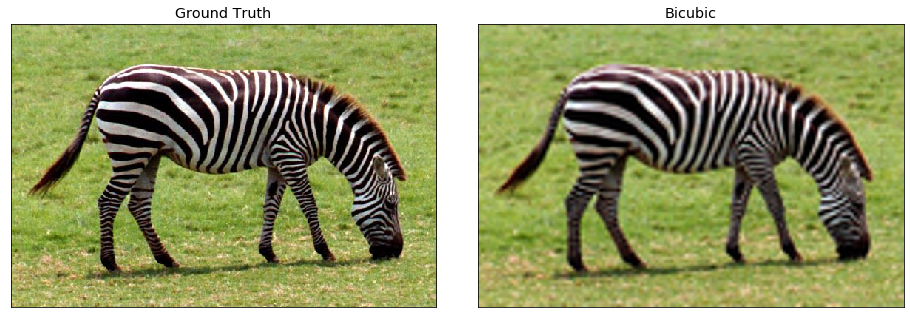

In [14]:
print(f'Image dim : {img_hr_np.shape}')

fig, axes = tensors_as_images([img_hr_tr, img_bicubic_tr],
                              titles=['Ground Truth', 'Bicubic'],
                              figsize=(16,16))

In [15]:
noise = net_input.detach().clone()

# HyperParmaters for each image
if factor == 4:
    inp_lr = 0.01
    net_lr = 0.01
    num_iter = 2000
    reg_noise_std = 1.0/30
elif factor == 8:
    inp_lr = 0.001
    net_lr = 0.001
    num_iter = 4000
    reg_noise_std = 0.001
        
print(f'Hyperparameters : INPUT_LR = {inp_lr}, NETWORK_LR = {net_lr}, num_iter = {num_iter},  std = {reg_noise_std}')

Hyperparameters : INPUT_LR = 0.01, NETWORK_LR = 0.01, num_iter = 2000,  std = 0.03333333333333333


In [16]:
inp_optimizer = torch.optim.Adam([new_input.requires_grad_()], lr=inp_lr)
net_optimizer = torch.optim.Adam(net.parameters(), lr=net_lr)

show_every = 100

psnr_lr_res = []
psnr_hr_res = []
losses_res = []

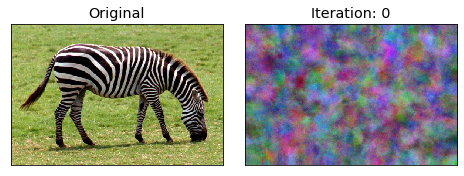

Iteration  100   Loss = 0.001242   PSNR_LR = 29.057205   PSNR_HR=22.48569898 
Iteration  200   Loss = 0.000568   PSNR_LR = 32.458838   PSNR_HR=23.08019797 


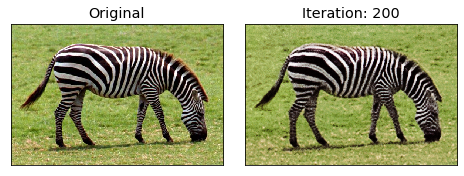

Iteration  300   Loss = 0.000343   PSNR_LR = 34.644670   PSNR_HR=23.33690707 
Iteration  400   Loss = 0.000225   PSNR_LR = 36.472639   PSNR_HR=23.38831212 


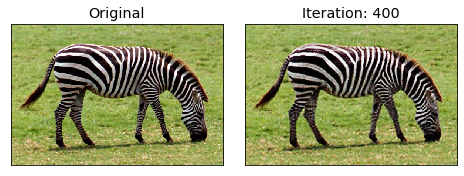

Iteration  500   Loss = 0.000180   PSNR_LR = 37.452285   PSNR_HR=23.40147777 
Iteration  600   Loss = 0.000151   PSNR_LR = 38.209946   PSNR_HR=23.36098080 


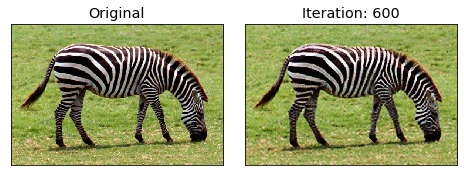

Iteration  700   Loss = 0.000129   PSNR_LR = 38.899952   PSNR_HR=23.36101414 
Iteration  800   Loss = 0.000106   PSNR_LR = 39.731590   PSNR_HR=23.37592020 


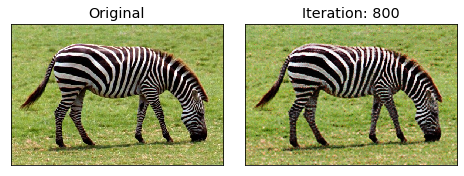

Iteration  900   Loss = 0.000102   PSNR_LR = 39.900674   PSNR_HR=23.37883636 
Iteration  1000   Loss = 0.000083   PSNR_LR = 40.834083   PSNR_HR=23.39496464 


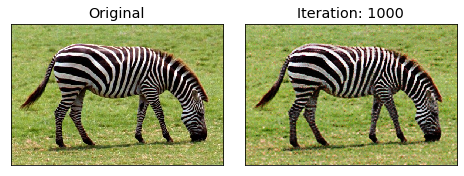

Iteration  1100   Loss = 0.000077   PSNR_LR = 41.124101   PSNR_HR=23.38803030 
Iteration  1200   Loss = 0.000079   PSNR_LR = 41.044272   PSNR_HR=23.34585454 


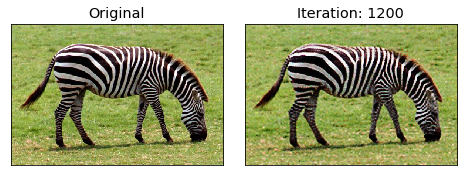

Iteration  1300   Loss = 0.000067   PSNR_LR = 41.755722   PSNR_HR=23.34701919 
Iteration  1400   Loss = 0.000062   PSNR_LR = 42.049420   PSNR_HR=23.35570202 


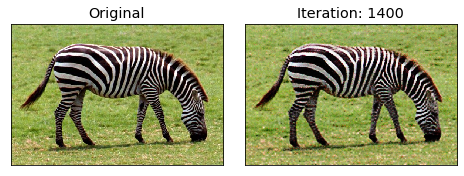

Iteration  1500   Loss = 0.000052   PSNR_LR = 42.821140   PSNR_HR=23.36708282 
Iteration  1600   Loss = 0.000053   PSNR_LR = 42.765673   PSNR_HR=23.36023838 


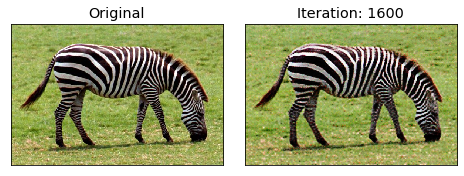

Iteration  1700   Loss = 0.000046   PSNR_LR = 43.343718   PSNR_HR=23.35434949 
Iteration  1800   Loss = 0.000044   PSNR_LR = 43.524805   PSNR_HR=23.33490505 


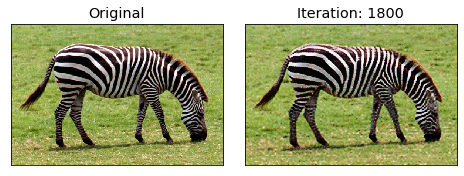

Iteration  1900   Loss = 0.000053   PSNR_LR = 42.779609   PSNR_HR=23.32871919 
Done training final Loss = 3.9849073800724e-05   PSNR_LR = 43.99581742551596   PSNR_HR = 23.33459909804054


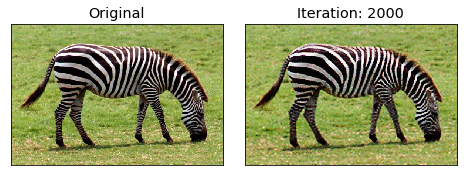

In [17]:
for i in range(num_iter):
    inp_optimizer.zero_grad()
    net_optimizer.zero_grad()
    
    if reg_noise_std > 0:
        net_input_mod = new_input + (noise.normal_() * reg_noise_std)
    else:
        net_input_mod = new_input.clone()
    
    out = net(net_input_mod)
    out_copy = out.detach().cpu()
    out_down = downsampler(out)
    
    loss = mse(out_down, img_lr_tr.to(device))
    loss.backward()
    
    inp_optimizer.step()
    net_optimizer.step()
    
    psnr_lr = peak_signal_noise_ratio(img_lr_np, out_down.detach().cpu().numpy()[0]) 
    psnr_hr = peak_signal_noise_ratio(img_hr_np, out_copy.numpy()[0])
    
    psnr_lr_res.append(psnr_lr)
    psnr_hr_res.append(psnr_hr)
    losses_res.append(loss.item())
    
    print('Iteration  %d   Loss = %06f   PSNR_LR = %06f   PSNR_HR = %06f' % 
          (i, loss.item(), psnr_lr, psnr_hr), '\r', end='')
    if i % show_every == 0 and i:
        print('Iteration  %d   Loss = %06f   PSNR_LR = %06f   PSNR_HR=%06f' % 
              (i, loss.item(), psnr_lr, psnr_hr))
    if i % (show_every*2) == 0:
        fig, axes = tensors_as_images([img_hr_tr, out_copy[0]], 
                                      titles=['Original', f'Iteration: {i}'])
        
print(f'Done training final Loss = {loss.item()}   PSNR_LR = {psnr_lr}   PSNR_HR = {psnr_hr}')
fig, axes = tensors_as_images([img_hr_tr, out_copy[0].detach()], 
                                    titles=['Original', f'Iteration: {num_iter}'])

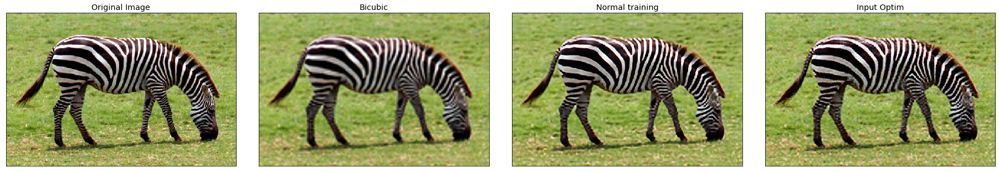

In [18]:
# Showing result of the training
with torch.no_grad():
    new_input = new_input.detach()
    output = net(new_input).detach()
    output = output.squeeze(dim=0)
    
    fig, axes = tensors_as_images([img_hr_tr, img_bicubic_tr, normal_training_output, output], 
                                    titles=['Original Image', 'Bicubic', 'Normal training', 'Input Optim'],
                                    figsize=(32,32))
    
    input_optim_output = output.clone().detach().cpu()
    output_pil = np_to_pil(input_optim_output.numpy())
    output_pil.save(f'results/sr/{IMAGE}_input_optimization_{factor}.png')
    

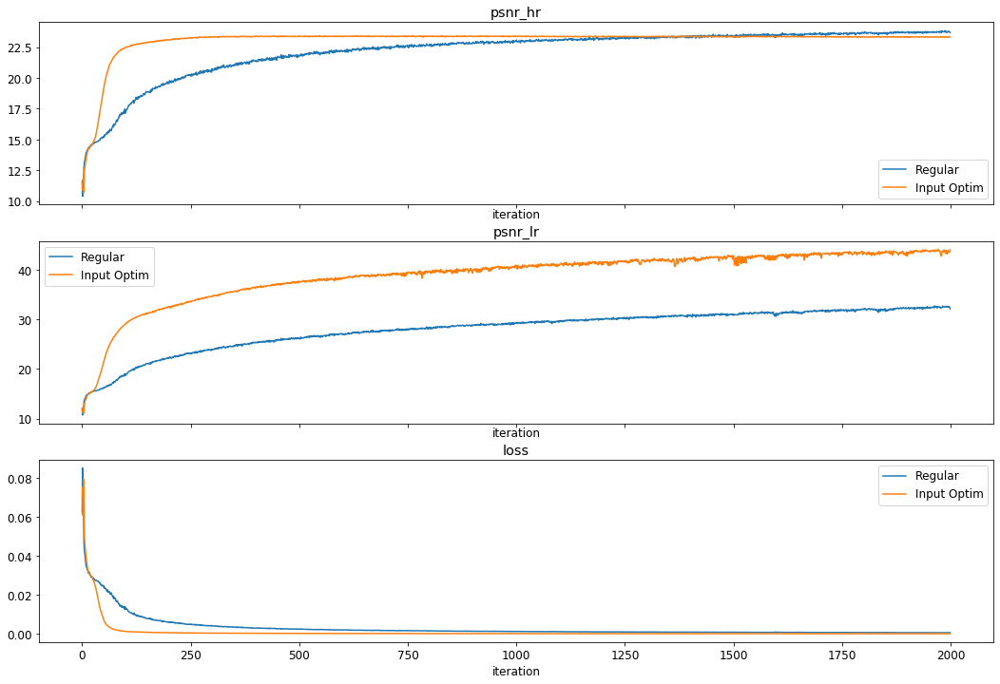

In [19]:
experiments_results_fig = plot_experiment_results({'psnr_hr': psnr_hr_res, 'psnr_lr': psnr_lr_res, 'loss': losses_res}, 'Input Optim', fig=experiments_results_fig)
experiments_results_fig

In [20]:
# Cleanup
del net
del inp_optimizer
del net_optimizer
del psnr_hr_res
del psnr_lr_res
del losses_res

# Adverserial training

In [21]:
from models.adverserialModel import *

# Models

if IMAGE == 'zebra':
    gen = UNet(input_depth, output_depth, nu, nd, ns, ku, kd, ks)
else:
    assert False    
gen.to(device)

dsc = Discriminator(img_lr_tr.shape).to(device)

In [22]:
# Hyperparams
show_every = 50

if factor == 4:
    reg_noise_std = 0.005
    DSC_LR = 0.001
    GEN_LR = 0.001
    WEIGHT_DECAY = 0.00
    DATA_LABEL = 1
    LABEL_NOISE = 0.0
    num_iter = 1800

    OPTIMIZE_INPUT = True
    INP_LR = 0.01
elif factor == 8:
    reg_noise_std = 0.00
    DSC_LR = 0.001
    GEN_LR = 0.001
    WEIGHT_DECAY = 0.00
    DATA_LABEL = 1
    LABEL_NOISE = 0.0
    num_iter = 4000

    OPTIMIZE_INPUT = False
    INP_LR = 0.01
else:
    assert False

In [23]:
# net input
adv_input = net_input.clone().detach()
if OPTIMIZE_INPUT:
    inp_optimizer = torch.optim.Adam([adv_input.requires_grad_()], INP_LR, weight_decay=WEIGHT_DECAY)

# Optimizers
dsc_optimizer = torch.optim.Adam(dsc.parameters(), DSC_LR, weight_decay=WEIGHT_DECAY)
gen_optimizer = torch.optim.Adam(gen.parameters(), GEN_LR, weight_decay=WEIGHT_DECAY)

# Losses
def dsc_loss_fn(y_data, y_generated):
    return discriminator_loss_fn(y_data, y_generated, DATA_LABEL, LABEL_NOISE)

def gen_loss_fn(y_generated):
    return generator_loss_fn(y_generated, DATA_LABEL)

# Discriminator input processing
def gen_fn(y, *not_used):
    return downsampler(y)

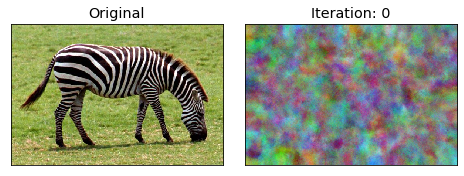

Iteration  50   Gen Loss = 13.388914   Dsc Loss = 0.206856   PSNR_LR = 10.506213   PSNR_HR = 10.000736 
Iteration  100   Gen Loss = 33.056011   Dsc Loss = 0.017159   PSNR_LR = 14.782914   PSNR_HR = 13.606762 


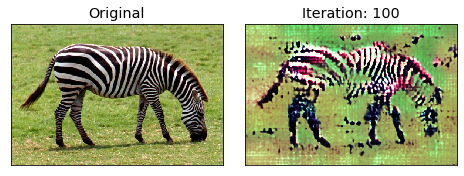

Iteration  150   Gen Loss = 31.743828   Dsc Loss = 1.060859   PSNR_LR = 14.114849   PSNR_HR = 13.131161  
Iteration  200   Gen Loss = 1.951052   Dsc Loss = 0.005227   PSNR_LR = 16.320584   PSNR_HR = 14.641266   


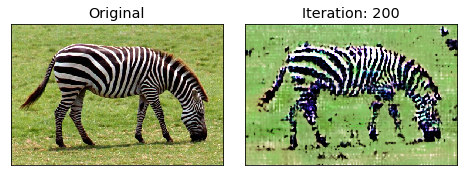

Iteration  250   Gen Loss = 24.653383   Dsc Loss = 0.000000   PSNR_LR = 16.249494   PSNR_HR = 14.485654  
Iteration  300   Gen Loss = 89.829948   Dsc Loss = 0.000000   PSNR_LR = 18.227095   PSNR_HR = 15.928229  


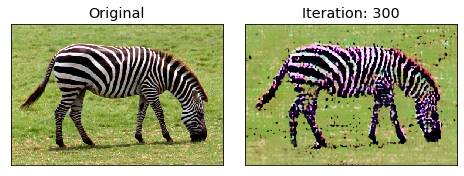

Iteration  350   Gen Loss = 0.004862   Dsc Loss = 0.000000   PSNR_LR = 18.029506   PSNR_HR = 15.792740 7  
Iteration  400   Gen Loss = 56.891560   Dsc Loss = 0.000001   PSNR_LR = 16.804118   PSNR_HR = 14.671251   


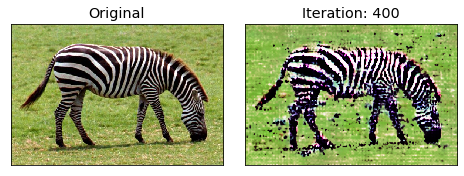

Iteration  450   Gen Loss = 3.855148   Dsc Loss = 28.176138   PSNR_LR = 19.026265   PSNR_HR = 16.792470  
Iteration  500   Gen Loss = 81.321014   Dsc Loss = 7.177318   PSNR_LR = 19.221413   PSNR_HR = 16.343173   


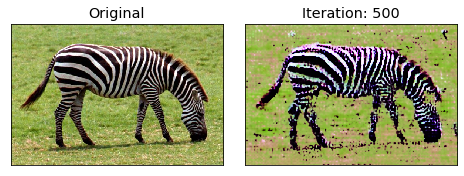

Iteration  550   Gen Loss = 65.680359   Dsc Loss = 0.000000   PSNR_LR = 18.059960   PSNR_HR = 15.648483   
Iteration  600   Gen Loss = 117.635300   Dsc Loss = 0.000000   PSNR_LR = 20.275865   PSNR_HR = 16.892929  


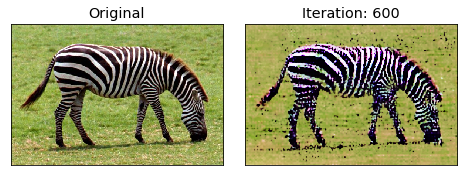

Iteration  650   Gen Loss = 176.723389   Dsc Loss = 0.000000   PSNR_LR = 19.520088   PSNR_HR = 16.594779  
Iteration  700   Gen Loss = 126.236252   Dsc Loss = 0.000000   PSNR_LR = 19.847180   PSNR_HR = 16.890825  


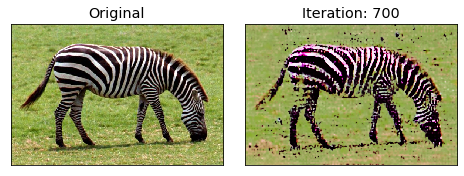

Iteration  750   Gen Loss = 131.566833   Dsc Loss = 7.008356   PSNR_LR = 20.658090   PSNR_HR = 17.515301  
Iteration  800   Gen Loss = 109.585403   Dsc Loss = 0.000000   PSNR_LR = 18.280200   PSNR_HR = 15.459242  


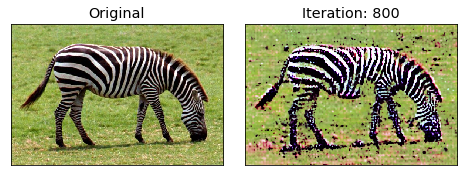

Iteration  850   Gen Loss = 254.783630   Dsc Loss = 0.000000   PSNR_LR = 19.781013   PSNR_HR = 16.552631  
Iteration  900   Gen Loss = 91.214958   Dsc Loss = 2.156725   PSNR_LR = 21.073084   PSNR_HR = 17.367931   


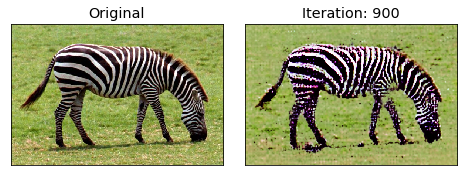

Iteration  950   Gen Loss = 150.196213   Dsc Loss = 0.000000   PSNR_LR = 20.968971   PSNR_HR = 17.355724 
Iteration  1000   Gen Loss = 124.418411   Dsc Loss = 0.000000   PSNR_LR = 21.419993   PSNR_HR = 17.579757 


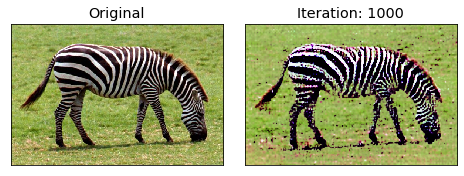

Iteration  1050   Gen Loss = 100.274345   Dsc Loss = 0.000000   PSNR_LR = 22.514950   PSNR_HR = 18.407680  
Iteration  1100   Gen Loss = 224.091080   Dsc Loss = 0.000000   PSNR_LR = 22.845417   PSNR_HR = 18.624461  


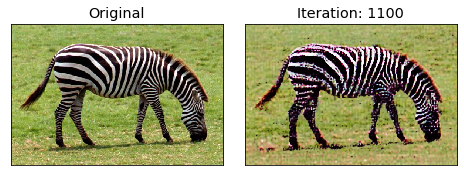

Iteration  1150   Gen Loss = 153.632431   Dsc Loss = 0.000000   PSNR_LR = 23.086502   PSNR_HR = 18.782263  
Iteration  1200   Gen Loss = 72.104492   Dsc Loss = 0.000000   PSNR_LR = 23.749010   PSNR_HR = 19.013748   


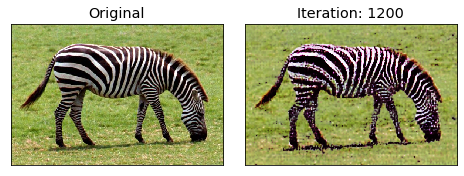

Iteration  1250   Gen Loss = 184.056168   Dsc Loss = 0.000000   PSNR_LR = 24.365386   PSNR_HR = 20.000349  
Iteration  1300   Gen Loss = 118.656830   Dsc Loss = 0.000000   PSNR_LR = 23.947717   PSNR_HR = 19.269304  


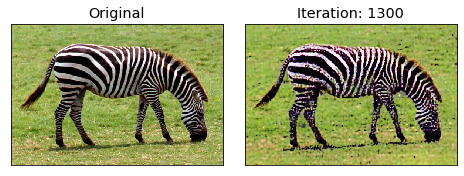

Iteration  1350   Gen Loss = 69.282959   Dsc Loss = 16.322891   PSNR_LR = 25.101886   PSNR_HR = 20.127824  
Iteration  1400   Gen Loss = 125.469337   Dsc Loss = 0.000000   PSNR_LR = 25.725387   PSNR_HR = 20.608958  


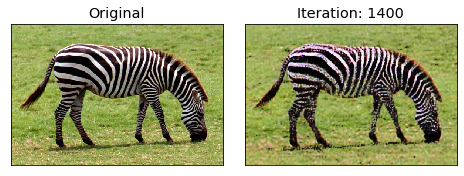

Iteration  1450   Gen Loss = 123.969040   Dsc Loss = 0.000000   PSNR_LR = 25.296650   PSNR_HR = 20.331532 
Iteration  1500   Gen Loss = 182.572311   Dsc Loss = 0.000000   PSNR_LR = 25.196286   PSNR_HR = 20.152007  


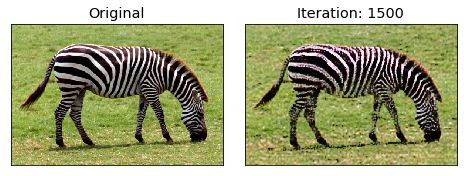

Iteration  1550   Gen Loss = 63.396111   Dsc Loss = 0.000000   PSNR_LR = 26.475639   PSNR_HR = 20.723135   
Iteration  1600   Gen Loss = 73.358559   Dsc Loss = 0.000000   PSNR_LR = 26.521466   PSNR_HR = 20.742729 6 


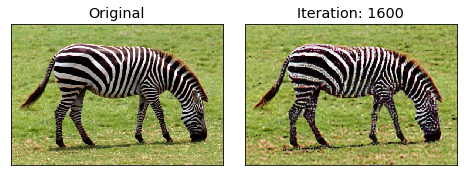

Iteration  1650   Gen Loss = 55.710938   Dsc Loss = 0.000000   PSNR_LR = 27.073652   PSNR_HR = 20.992376   
Iteration  1700   Gen Loss = 85.546082   Dsc Loss = 0.000000   PSNR_LR = 27.164747   PSNR_HR = 21.358780   


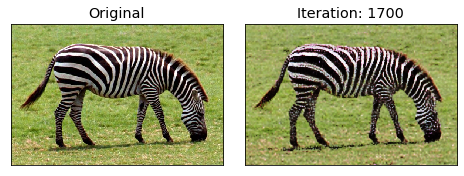

Iteration  1750   Gen Loss = 75.122101   Dsc Loss = 0.000000   PSNR_LR = 26.629649   PSNR_HR = 21.067631    


In [24]:
target_img = img_lr_tr.clone().unsqueeze(dim=0).to(device)

psnr_hr_res = []
psnr_lr_res = []

for i in range(num_iter):
    if OPTIMIZE_INPUT:
        inp_optimizer.zero_grad()
        
    if reg_noise_std > 0:
        adv_input_mod = adv_input + (noise.normal_() * reg_noise_std)
    else:
        adv_input_mod = adv_input.clone()
    
    dsc_loss, gen_loss, output = train_batch(dsc, gen, dsc_loss_fn, gen_loss_fn,
                                            dsc_optimizer, gen_optimizer,
                                            target_img, adv_input_mod,
                                            gen_fn=gen_fn)
    
    if OPTIMIZE_INPUT:
        inp_optimizer.step()
        
    psnr_lr = peak_signal_noise_ratio(img_lr_np, downsampler(output).detach().cpu().numpy()[0]) 
    psnr_hr = peak_signal_noise_ratio(img_hr_np, output.detach().clone().cpu().numpy()[0])
    
    psnr_lr_res.append(psnr_lr)
    psnr_hr_res.append(psnr_hr)
    
    print('Iteration  %d   Gen Loss = %06f   Dsc Loss = %06f   PSNR_LR = %06f   PSNR_HR = %06f' % 
          (i, gen_loss, dsc_loss, psnr_lr, psnr_hr), '\r', end='')
    if i % show_every == 0 and i:
        print('Iteration  %d   Gen Loss = %06f   Dsc Loss = %06f   PSNR_LR = %06f   PSNR_HR = %06f' % 
              (i, gen_loss, dsc_loss, psnr_lr, psnr_hr))
    if i % (show_every*2) == 0:
        fig, axes = tensors_as_images([img_hr_tr, output[0].detach()], 
                                      titles=['Original', f'Iteration: {i}'])

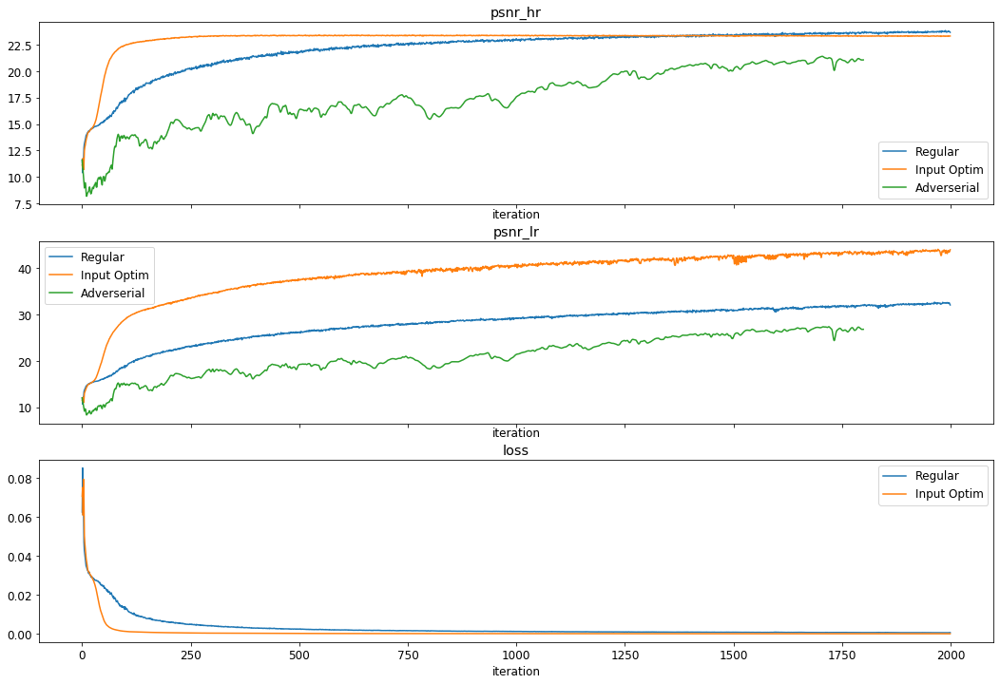

In [25]:
experiments_results_fig = plot_experiment_results({'psnr_hr': psnr_hr_res, 'psnr_lr': psnr_lr_res}, 'Adverserial', fig=experiments_results_fig)
experiments_results_fig

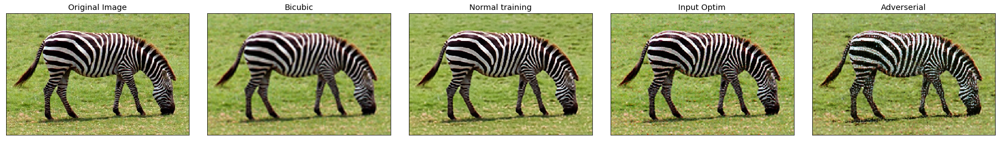

In [26]:
# Showing result of the training
with torch.no_grad():
    new_input = adv_input.detach()
    output = gen(adv_input).detach()
    output = output.squeeze(dim=0)
    
    adverserial_output = output.clone().detach().cpu()
    
    fig, axes = tensors_as_images([img_hr_tr, img_bicubic_tr, normal_training_output, input_optim_output, adverserial_output], 
                                    titles=['Original Image', 'Bicubic', 'Normal training', 'Input Optim', 'Adverserial'],
                                    figsize=(32,32))
    
    output_pil = np_to_pil(adverserial_output.numpy())
    output_pil.save(f'results/sr/{IMAGE}_adverserial_{factor}.png')

In [27]:
# Cleanup
del gen
del dsc
del gen_optimizer
del dsc_optimizer
del psnr_hr_res
del psnr_lr_res